<a href="https://colab.research.google.com/github/Markus-Pobitzer/sdxl_prompt_test/blob/main/prompt_test.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install diffusers transformers accelerate safetensors invisible-watermark>=0.2.0

In [2]:
from PIL import Image
from pathlib import Path

# Used for visualization of images, from diffusers repo
def image_grid(imgs, rows, cols):
    assert len(imgs) == rows * cols

    w, h = imgs[0].size
    grid = Image.new("RGB", size=(cols * w, rows * h))
    grid_w, grid_h = grid.size

    for i, img in enumerate(imgs):
        grid.paste(img.resize((w, h)), box=(i % cols * w, i // cols * h))
    return grid

def save_images(path, images, names):
  for i in range(len(images)):
      images[i].save(Path(path, names[i]))

In [3]:
from diffusers import DiffusionPipeline
import torch

# pipe = DiffusionPipeline.from_pretrained("stabilityai/stable-diffusion-xl-base-1.0", torch_dtype=torch.float32, use_safetensors=True, variant="fp32")
pipe = DiffusionPipeline.from_pretrained("stabilityai/stable-diffusion-xl-base-1.0", torch_dtype=torch.float16, use_safetensors=True, variant="fp16")
pipe.to("cuda")

# Make sure to select GPU runtime: Runtime -> Change runtime type -> GPU (Hardware accelerater)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

StableDiffusionXLPipeline {
  "_class_name": "StableDiffusionXLPipeline",
  "_diffusers_version": "0.19.1",
  "_name_or_path": "stabilityai/stable-diffusion-xl-base-1.0",
  "force_zeros_for_empty_prompt": true,
  "scheduler": [
    "diffusers",
    "EulerDiscreteScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "text_encoder_2": [
    "transformers",
    "CLIPTextModelWithProjection"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "tokenizer_2": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

# Text encoder test

We will generate images while based on two propmts.

In [6]:
# Settings for the experiment, change as you see fit
prompt_a = "an apple"
prompt_b = "a banana"
seed = 1234
num_images_per_prompt = 1 # batch size, increase if you have better GPU

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

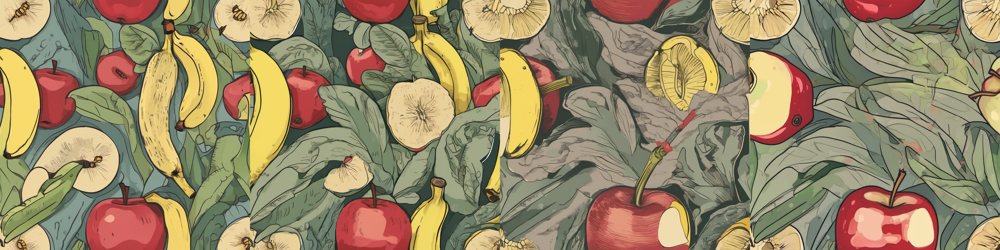

In [7]:
# Compare full prompt (prompt_a + prompt_b) vs. full prompt (prompt_b + prompt_a) vs. prompt=prompt_a, prompt_2=prompt_b vs. prompt=prompt_b, prompt_2prompt_a

# Full prompt: prompt_a + prompt_b
generator = torch.Generator(device='cuda').manual_seed(seed)
images_7 = pipe(prompt=prompt_a + ", " + prompt_b, num_images_per_prompt=num_images_per_prompt, generator=generator).images

# Full prompt: prompt_b + prompt_a
generator = torch.Generator(device='cuda').manual_seed(seed)
images_8 = pipe(prompt=prompt_b + ", " + prompt_a, num_images_per_prompt=num_images_per_prompt, generator=generator).images

# prompt_a, prompt_b
generator = torch.Generator(device='cuda').manual_seed(seed)
images_9 = pipe(prompt=prompt_a, prompt_2=prompt_b, num_images_per_prompt=num_images_per_prompt, generator=generator).images

# prompt_b, prompt_a
generator = torch.Generator(device='cuda').manual_seed(seed)
images_10 = pipe(prompt=prompt_b, prompt_2=prompt_a, num_images_per_prompt=num_images_per_prompt, generator=generator).images

# Output as follow:
#   | prompt_a + prompt_b | prompt_b + prompt_a | prompt_a, prompt_b | prompt_b, prompt_a |
# 0 |     images_7[0]     |     images_8[0]     |    images_9[0]     |    images_10[0]    |
# ...

image_grid([img for pair in zip(images_7, images_8, images_9, images_10) for img in pair], num_images_per_prompt, 4)

In [ ]:
# For the complete output
# Each prompt on its own
generator = torch.Generator(device='cuda').manual_seed(seed)
images_1 = pipe(prompt=prompt_a, num_images_per_prompt=num_images_per_prompt, generator=generator).images

generator = torch.Generator(device='cuda').manual_seed(seed)
images_2 = pipe(prompt=prompt_b, num_images_per_prompt=num_images_per_prompt, generator=generator).images
image_grid([img for pair in zip(images_1, images_2) for img in pair], num_images_per_prompt, 2)

# Compare prompts when we only "use" one text encoder with an actual promopt

# prompt_a, " "
generator = torch.Generator(device='cuda').manual_seed(seed)
images_3 = pipe(prompt=prompt_a, prompt_2=" ", num_images_per_prompt=num_images_per_prompt, generator=generator).images

# prompt_b, " "
generator = torch.Generator(device='cuda').manual_seed(seed)
images_4 = pipe(prompt=prompt_b, prompt_2=" ", num_images_per_prompt=num_images_per_prompt, generator=generator).images

# " ", prompt_a
generator = torch.Generator(device='cuda').manual_seed(seed)
images_5 = pipe(prompt=" ", prompt_2=prompt_a, num_images_per_prompt=num_images_per_prompt, generator=generator).images

# " ", prompt_b
generator = torch.Generator(device='cuda').manual_seed(seed)
images_6 = pipe(prompt=" ", prompt_2=prompt_b, num_images_per_prompt=num_images_per_prompt, generator=generator).images

# Compare full prompt (twice, differently ordered) vs. prompt_a, prompt_b vs. prompt_b, prompt_a

# Full prompt: prompt_a + prompt_b
generator = torch.Generator(device='cuda').manual_seed(seed)
images_7 = pipe(prompt=prompt_a + ", " + prompt_b, num_images_per_prompt=num_images_per_prompt, generator=generator).images

# Full prompt: prompt_b + prompt_a
generator = torch.Generator(device='cuda').manual_seed(seed)
images_8 = pipe(prompt=prompt_b + ", " + prompt_a, num_images_per_prompt=num_images_per_prompt, generator=generator).images

# prompt_a, prompt_b
generator = torch.Generator(device='cuda').manual_seed(seed)
images_9 = pipe(prompt=prompt_a, prompt_2=prompt_b, num_images_per_prompt=num_images_per_prompt, generator=generator).images

# prompt_b, prompt_a
generator = torch.Generator(device='cuda').manual_seed(seed)
images_10 = pipe(prompt=prompt_b, prompt_2=prompt_a, num_images_per_prompt=num_images_per_prompt, generator=generator).images

In [ ]:
showcase = images_1[:num_images_per_prompt] + images_2[:num_images_per_prompt] + images_3[:num_images_per_prompt] + images_4[:num_images_per_prompt] \
    + images_5[:num_images_per_prompt] + images_6[:num_images_per_prompt] + images_7[:num_images_per_prompt] + images_8[:num_images_per_prompt] \
    + images_9[:num_images_per_prompt] + images_10[:num_images_per_prompt]
image_grid(showcase, 10, num_images_per_prompt)

# If it is to big to load in notebook save it instead
# showcase_img = image_grid(showcase, 10, num_images_per_prompt)
# save_images("", [showcase_img], ['<1> ' + prompt_a + ' <2> ' + prompt_b + ".png"])

## Using negative prompts too

In [8]:
# Here we use the prompt of one text encoder as the negative prompt of the other :)
prompt_a = "Red"
prompt_b = "Green"
seed = 1234
num_images_per_prompt = 1

# prompt_a
generator = torch.Generator(device='cuda').manual_seed(seed)
images_11 = pipe(prompt=prompt_a, negative_prompt=prompt_b, \
                num_images_per_prompt=num_images_per_prompt, generator=generator).images

# prompt_b
generator = torch.Generator(device='cuda').manual_seed(seed)
images_12 = pipe(prompt=prompt_b, negative_prompt=prompt_a, \
                 num_images_per_prompt=num_images_per_prompt, generator=generator).images

# prompt_a, prompt_b
generator = torch.Generator(device='cuda').manual_seed(seed)
images_13 = pipe(prompt=prompt_a, prompt_2=prompt_b, negative_prompt=prompt_b , negative_prompt_2=prompt_a, \
                num_images_per_prompt=num_images_per_prompt, generator=generator).images

# prompt_b, prompt_a
generator = torch.Generator(device='cuda').manual_seed(seed)
images_14 = pipe(prompt=prompt_b, prompt_2=prompt_a, negative_prompt=prompt_a , negative_prompt_2=prompt_b, \
                 num_images_per_prompt=num_images_per_prompt, generator=generator).images

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

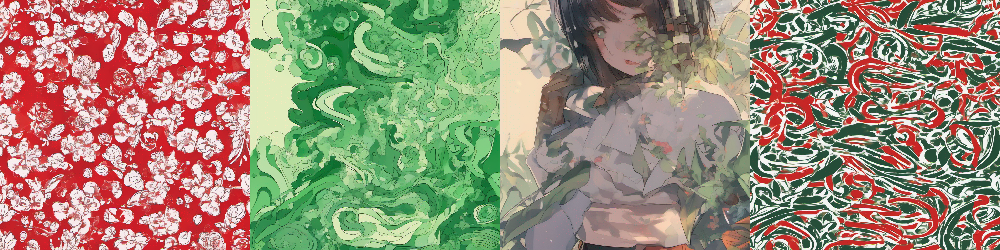

In [12]:
# if num_images_per_prompt == 1
image_grid(images_11 + images_12 + images_13 + images_14, num_images_per_prompt, 4)
# Else
# image_grid(images_11 + images_12 + images_13 + images_14, 4, num_images_per_prompt)